## Импорт пакетов

In [16]:
!pip install pmdarima

     |████████████████████████████████| 592 kB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 15.6 MB 7.3 MB/s eta 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.0
    Uninstalling numpy-1.20.0:
      Successfully uninstalled numpy-1.20.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.7.0 requires torch==1.6.0, but you have torch 1.8.0 which is incompatible.
pytorch-lightning 1.0.5 requires torch<1.8,>=1.3, but you have torch 1.8.0 which is incompatible.
You should consider upgrading via the '/Users/ggoloviznin/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [17]:
!pip install sktime

     |████████████████████████████████| 4.4 MB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 2.2 MB 8.9 MB/s eta 0:00:01
     |████████████████████████████████| 10.4 MB 6.4 MB/s eta 0:00:01
     |████████████████████████████████| 9.5 MB 8.6 MB/s eta 0:00:01
     |████████████████████████████████| 7.2 MB 10.5 MB/s eta 0:00:01
     |████████████████████████████████| 18.5 MB 1.2 MB/s  eta 0:00:01
  Attempting uninstall: pandas
    Found existing installation: pandas 1.0.1
    Uninstalling pandas-1.0.1:
      Successfully uninstalled pandas-1.0.1
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.31.0
ERROR: Cannot uninstall 'llvmlite'. It is a distutils installed project and thus we cannot accurately determine which files belong to it which would lead to only a partial uninstall.
You should consider upgrading via the '/Users/ggoloviznin/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [26]:
import pandas as pd
import csv
import numpy as np
from matplotlib import pyplot
from matplotlib.pyplot import figure
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import urllib.parse
from sklearn.metrics import mean_absolute_error
import matplotlib.ticker as plticker
import statsmodels.api as sm
from pmdarima.arima import auto_arima
from pmdarima.arima import ADFTest
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from sktime.forecasting.ets import AutoETS
from sktime.forecasting.base import ForecastingHorizon

import matplotlib.pyplot as plt
from linearmodels.datasets import wage_panel
from linearmodels.panel import PooledOLS
import statsmodels.api as sm

## Задание 1

Данные взяты из реестра данных канадсокго правительства по месячным продажам автомобилей с 1946 по 2021 год

**New motor vehicle sales**
Number of units and total sales of new motor vehicles by vehicle type and origin of manufacture, monthly.

Publisher - Current Organization Name: Statistics Canada

Licence: Open Government Licence - Canada

https://open.canada.ca/data/en/dataset/0decc62b-3047-417c-81e7-d8f96fac09a9



In [27]:
FILE = '20100001.csv' # pass to the downloaded csv file
df = pd.read_csv(FILE, error_bad_lines=False)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3062: DtypeWarning: Columns (16) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [28]:
df.head()

,REF_DATE,GEO,DGUID,Vehicle type,Origin of manufacture,Sales,Seasonal adjustment,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,1946-01,Canada,2016A000011124,"Total, new motor vehicles","Total, country of manufacture",Units,Unadjusted,Units,300,units,0,v42169911,1.1.1.1.1,2756.0,NaN,NaN,NaN,0
1,1946-01,Canada,2016A000011124,"Total, new motor vehicles","Total, country of manufacture",Dollars,Unadjusted,Dollars,81,thousands,3,v42169913,1.1.1.2.1,4507.0,NaN,NaN,NaN,0
2,1946-01,Canada,2016A000011124,Passenger cars,"Total, country of manufacture",Units,Unadjusted,Units,300,units,0,v42169920,1.2.1.1.1,1102.0,NaN,NaN,NaN,0
3,1946-01,Canada,2016A000011124,Passenger cars,"Total, country of manufacture",Units,Seasonally adjusted,Units,300,units,0,v42169921,1.2.1.1.2,1468.0,NaN,NaN,t,0
4,1946-01,Canada,2016A000011124,Passenger cars,"Total, country of manufacture",Dollars,Unadjusted,Dollars,81,thousands,3,v42169922,1.2.1.2.1,1604.0,NaN,NaN,NaN,0


In [29]:
df['Vehicle type'].unique()

array(['Total, new motor vehicles', 'Passenger cars', 'Trucks'],
      dtype=object)

In [30]:
condition_filter_1 = df['GEO'] == "Canada"
condition_filter_2 = df['Vehicle type'] == "Total, new motor vehicles"
condition_filter_3 = df['Origin of manufacture'] == "Total, country of manufacture"
condition_filter_4 = df['Sales'] == "Units"
condition_filter_5 = df['Seasonal adjustment'] == "Unadjusted"

df = df.loc[condition_filter_1 & 
                condition_filter_2 & 
                condition_filter_3 & 
                condition_filter_4 &
                condition_filter_5]
  

In [31]:
time_series = df[['REF_DATE', 'VALUE']]

In [32]:
time_series.dtypes

REF_DATE     object
VALUE       float64
dtype: object

## Задание 2

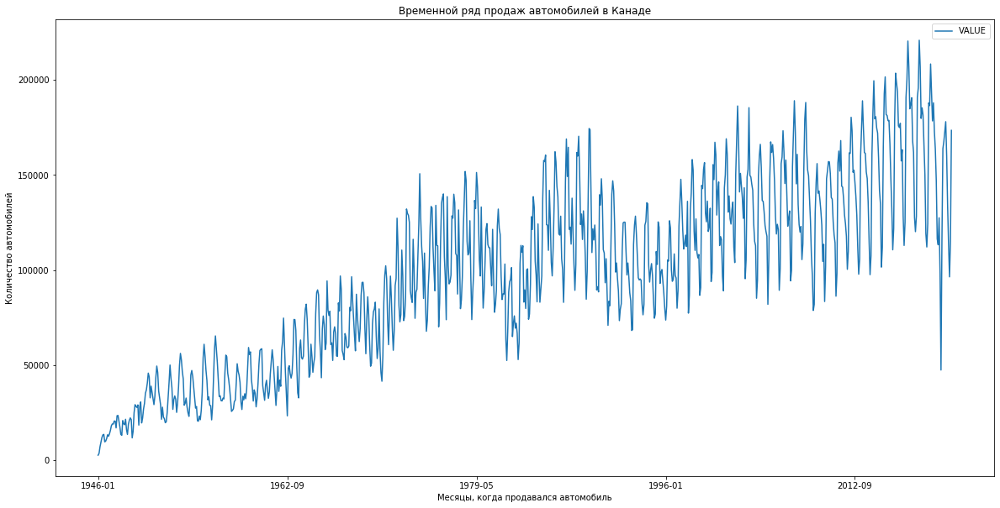

In [33]:
time_series.plot(x = 'REF_DATE', figsize=(20,10), title='Временной ряд продаж автомобилей в Канаде', xlabel='Месяцы, когда продавался автомобиль', ylabel='Количество автомобилей')

Очевидно, что ряд не является стационарным. Дисперсия и математическое ожидание меняются со временем.

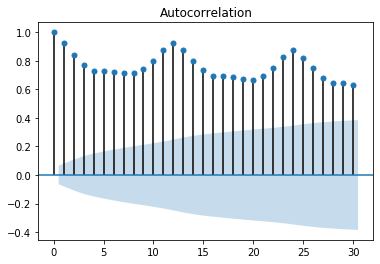

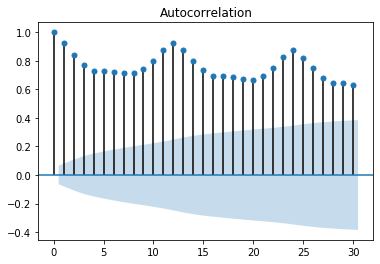

In [34]:
plot_acf(time_series['VALUE'])

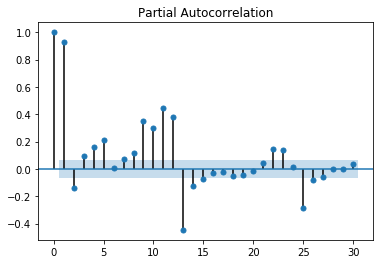

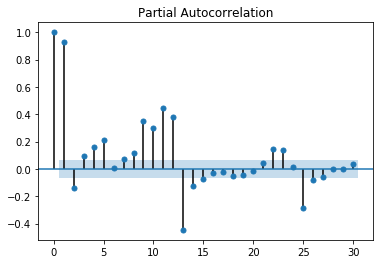

In [35]:
plot_pacf(time_series['VALUE'])

Достаточно логично, более ранние продажи наименее всего взаимосвязаны с "сегодняшней" продажей

In [36]:
%pip install parse

Defaulting to user installation because normal site-packages is not writeable
  Created wheel for parse: filename=parse-1.19.0-py3-none-any.whl size=24581 sha256=7c275ba1cd36b037f9620ec7cf86bfa38ba4b9ae25dd14e6b0ca928c988a8261
  Stored in directory: /Users/rustem/Library/Caches/pip/wheels/e5/33/1f/68392720485b3ecf125a69e700baaab7624616deedea2fa6e2
Successfully built parse
You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.8/bin/python3.8 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [37]:
# !pip install brewer2mpl
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import warnings; warnings.filterwarnings(action='once')

large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'figure.figsize': (16, 10),
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large}
plt.rcParams.update(params)
plt.style.use('seaborn-whitegrid')
sns.set_style("white")
%matplotlib inline

# Version
print(mpl.__version__)  #> 3.0.0
print(sns.__version__)  #> 0.9.0

3.1.2
0.10.1


In [38]:
from dateutil.parser import parse 

# Prepare data
time_series['year'] = [parse(d).year for d in time_series['REF_DATE']]
time_series['month'] = [parse(d).strftime('%b') for d in time_series['REF_DATE']]
years = time_series['year'].unique()

<ipython-input-38-e861fda0f5a8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time_series['year'] = [parse(d).year for d in time_series['REF_DATE']]


In [39]:
len(years)

76

Посмотрю на сезонные графики всех лет, скорее всего они все будут накладываться друг на друга, но тем не менее

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/

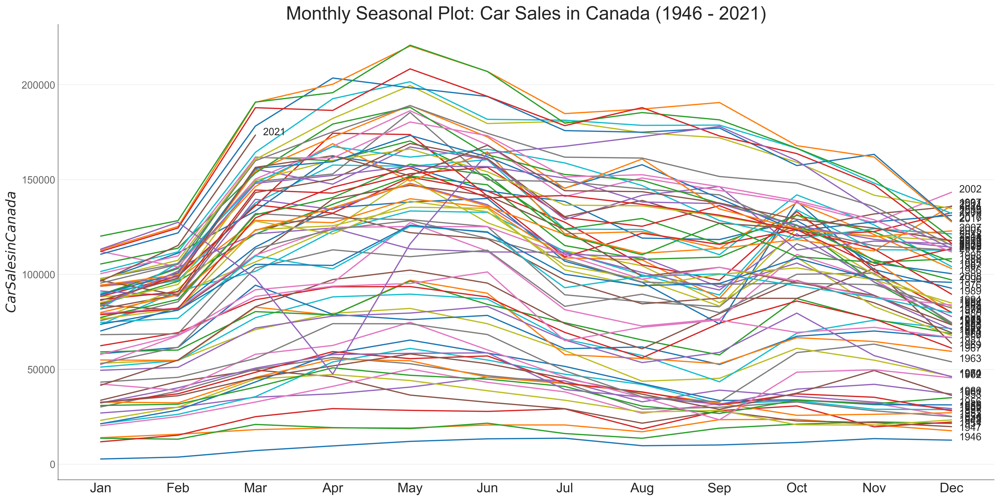

In [40]:
plt.figure(figsize=(20,10), dpi= 400)
for i in years:
  mask = (time_series['year'] == i)
  plt.plot('month', 'VALUE', data = time_series.loc[mask], label = i)
  plt.text(time_series.loc[time_series.year==i, :].shape[0]-.9, time_series.loc[time_series.year==i, 'VALUE'][-1:].values[0], i, fontsize=12)

# Decoration
plt.ylabel('$Сar Sales in Canada$')
plt.yticks(fontsize=12, alpha=.7)
plt.title("Monthly Seasonal Plot: Car Sales in Canada (1946 - 2021)", fontsize=22)
plt.grid(axis='y', alpha=.3)

# Remove borders
plt.gca().spines["top"].set_alpha(0.0)    
plt.gca().spines["bottom"].set_alpha(0.5)
plt.gca().spines["right"].set_alpha(0.0)    
plt.gca().spines["left"].set_alpha(0.5)   
#plt.legend(loc='upper right', ncol=2, fontsize=12)
plt.show()

Из этого графика понятно, что есть некоторый восходящий тренд в весне, и падение ближе к осени

Посмотрю на график последних 10 лет

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3

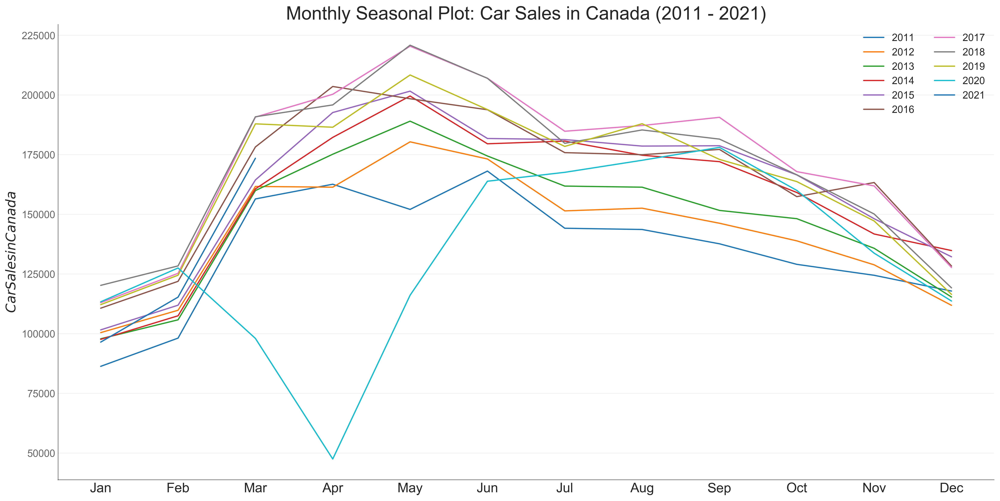

In [41]:
plt.figure(figsize=(20,10), dpi= 400)
for i in years[len(years) - 11:len(years)]:
  mask = (time_series['year'] == i)
  plt.plot('month', 'VALUE', data = time_series.loc[mask], label = i)

# Decoration
plt.ylabel('$Сar Sales in Canada$')
plt.yticks(fontsize=12, alpha=.7)
plt.title("Monthly Seasonal Plot: Car Sales in Canada (2011 - 2021)", fontsize=22)
plt.grid(axis='y', alpha=.3)

# Remove borders
plt.gca().spines["top"].set_alpha(0.0)    
plt.gca().spines["bottom"].set_alpha(0.5)
plt.gca().spines["right"].set_alpha(0.0)    
plt.gca().spines["left"].set_alpha(0.5)   
plt.legend(loc='upper right', ncol=2, fontsize=12)
plt.show()

Интересна очень сильная просадка в продаже автомобилей в период коронавируса - с февраля по апрель. Если посмотреть на график выше, то просадка настолько большая, что продажи откатились к значениям 1960го года

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3

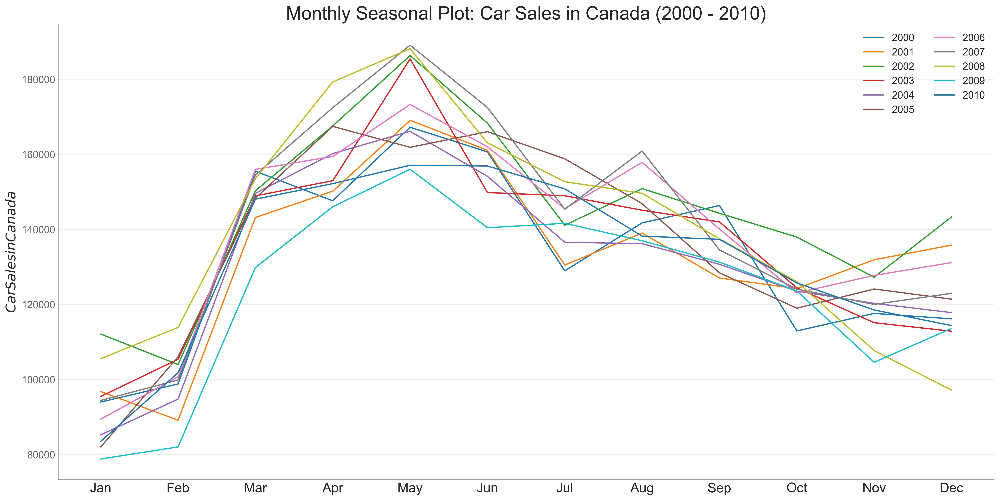

In [42]:
plt.figure(figsize=(20,10), dpi= 400)
for i in years[len(years) - 22:len(years) - 11]:
  mask = (time_series['year'] == i)
  plt.plot('month', 'VALUE', data = time_series.loc[mask], label = i)

# Decoration
plt.ylabel('$Сar Sales in Canada$')
plt.yticks(fontsize=12, alpha=.7)
plt.title("Monthly Seasonal Plot: Car Sales in Canada (2000 - 2010)", fontsize=22)
plt.grid(axis='y', alpha=.3)

# Remove borders
plt.gca().spines["top"].set_alpha(0.0)    
plt.gca().spines["bottom"].set_alpha(0.5)
plt.gca().spines["right"].set_alpha(0.0)    
plt.gca().spines["left"].set_alpha(0.5)   
plt.legend(loc='upper right', ncol=2, fontsize=12)
plt.show()

Интересно, что время мирового финансового кризиса 2007-2008 не было такого большого падения, которая была в коронавирус.

## Задание 3

In [43]:
time_series.dtypes

REF_DATE     object
VALUE       float64
year          int64
month        object
dtype: object

In [44]:
time_series_copy = time_series
time_series_copy.REF_DATE = pd.to_datetime(time_series_copy['REF_DATE'])
time_series_copy.index = time_series.REF_DATE
time_series.head()

/Users/rustem/Library/Python/3.8/lib/python/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,REF_DATE,VALUE,year,month
REF_DATE,,,,
1946-01-01,1946-01-01,2756.0,1946,Jan
1946-02-01,1946-02-01,3763.0,1946,Feb
1946-03-01,1946-03-01,7200.0,1946,Mar
1946-04-01,1946-04-01,9645.0,1946,Apr
1946-05-01,1946-05-01,12032.0,1946,May


In [45]:
time_series.dtypes

REF_DATE    datetime64[ns]
VALUE              float64
year                 int64
month               object
dtype: object

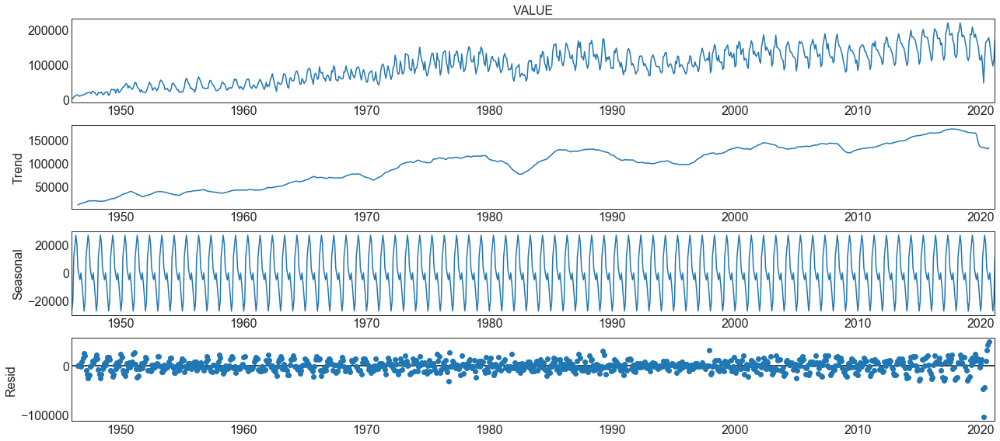

In [46]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(time_series['VALUE'], model='additive')
fig = decomposition.plot()
plt.show()

In [47]:
adf_test = ADFTest(alpha = 0.05)
print(adf_test.should_diff(time_series['VALUE']))
print('Отсюда, можно заключать что ряд нестационарный, хотя это и так видно по графикам)')

(0.01, False)
Отсюда, можно заключать что ряд нестационарный, хотя это и так видно по графикам)


*Являются ли ряды сезонными?*

Да, ряды являются сезонными - возрастают с февраля по май, и убывают с июня по декабрь

*Есть ли тренд?*

Да, есть восходящий тренд с сильный сезональностью.

*Стационарны ли ряды?*

Нет, ряды не являются стаицонарными. Такие характеристики, как математическое ожидание и дисперсия меняются со временем.

*Есть ли точки излома?*

Точки излома на сезонном графике в мае - пик продаж.

*Растет ли амплитуда колебаний ряда?*

Да, амплитуда колебаний ряда растет. Это видно на графике продаж за все годы.

## Задание 4

In [48]:
time_series[time_series.year > 2010].count()

REF_DATE    123
VALUE       123
year        123
month       123
dtype: int64

In [49]:
time_series.count()

REF_DATE    903
VALUE       903
year        903
month       903
dtype: int64

In [50]:
time_series[0:780]

,REF_DATE,VALUE,year,month
REF_DATE,,,,
1946-01-01,1946-01-01,2756.0,1946,Jan
1946-02-01,1946-02-01,3763.0,1946,Feb
1946-03-01,1946-03-01,7200.0,1946,Mar
1946-04-01,1946-04-01,9645.0,1946,Apr
1946-05-01,1946-05-01,12032.0,1946,May
...,...,...,...,...
2010-08-01,2010-08-01,138210.0,2010,Aug
2010-09-01,2010-09-01,137349.0,2010,Sep
2010-10-01,2010-10-01,125731.0,2010,Oct


Создадим test & train data

In [51]:
#Creating train and test set 
#Index 780 marks the end of 2010
train=time_series[0:780] 
test=time_series[780:]

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


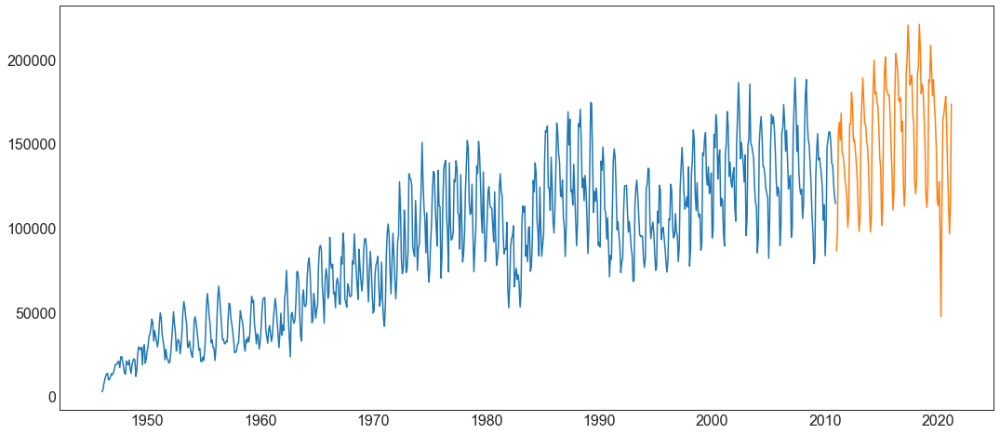

In [52]:
plt.plot('REF_DATE', 'VALUE', data = train)
plt.plot('REF_DATE', 'VALUE', data = test)
plt.show()

### Naive $\hat{y}_{t+1}=y_t$

In [53]:
train

,REF_DATE,VALUE,year,month
REF_DATE,,,,
1946-01-01,1946-01-01,2756.0,1946,Jan
1946-02-01,1946-02-01,3763.0,1946,Feb
1946-03-01,1946-03-01,7200.0,1946,Mar
1946-04-01,1946-04-01,9645.0,1946,Apr
1946-05-01,1946-05-01,12032.0,1946,May
...,...,...,...,...
2010-08-01,2010-08-01,138210.0,2010,Aug
2010-09-01,2010-09-01,137349.0,2010,Sep
2010-10-01,2010-10-01,125731.0,2010,Oct


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


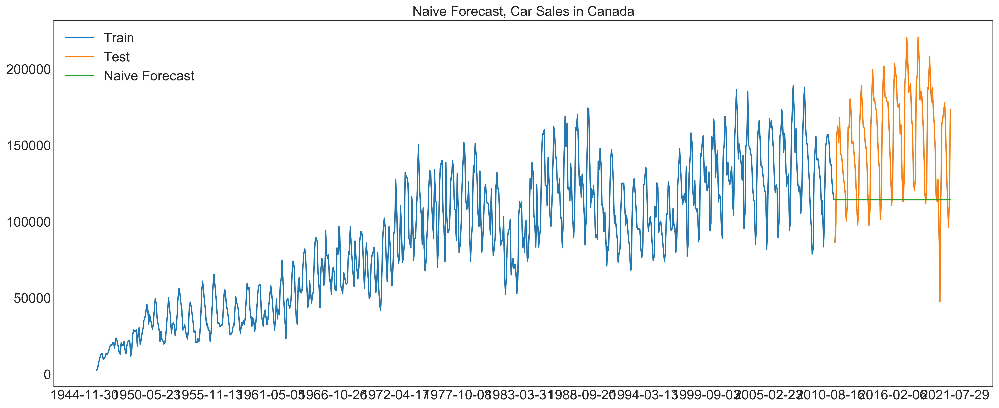

In [54]:
dd = np.asarray(train.VALUE)
y_hat = test.copy()
y_hat['naive'] = dd[len(dd)-1]
plt.figure(figsize=(20,8), dpi = 400)
plt.plot(train['REF_DATE'], train['VALUE'], label='Train')
plt.plot(test['REF_DATE'], test['VALUE'], label='Test')
plt.plot(y_hat['REF_DATE'], y_hat['naive'], label='Naive Forecast')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2000))
plt.title("Naive Forecast, Car Sales in Canada")
plt.show()

In [55]:
mae = mean_absolute_error(y_hat['naive'], test['VALUE'])
print('Naive MAE: ', mae)

Naive MAE:  44049.17886178862


### Сезонная наивность $\hat{y}_{t+1}=y_{t+1-12}$

In [56]:
def pysnaive(train_series,seasonal_periods,forecast_horizon):  
    if len(train_series)>= seasonal_periods: #checking if there are enough observations in the training data
        
        last_season=train_series.iloc[-seasonal_periods:]
        
        reps=np.int(np.ceil(forecast_horizon/seasonal_periods))
        
        fcarray=np.tile(last_season,reps)
        
        fcast=pd.Series(fcarray[:forecast_horizon])
        
        fitted = train_series.shift(seasonal_periods)
        
    else:
        fcast=print("Length of the trainining set must be greater than number of seasonal periods") 
    
    return fitted, fcast

In [57]:
train.index = pd.to_datetime(train['REF_DATE'])
test.index = pd.to_datetime(test['REF_DATE'])

In [58]:
py_snaive_fit = pysnaive(train["VALUE"], 
                     seasonal_periods=123,
                     forecast_horizon=123)[0]


In [59]:
py_snaive = pysnaive(train["VALUE"], 
                     seasonal_periods=123,
                     forecast_horizon=123)[1]


In [60]:
test['snaive'] = py_snaive.values 

<ipython-input-60-0f54bd5cf7b2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['snaive'] = py_snaive.values


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


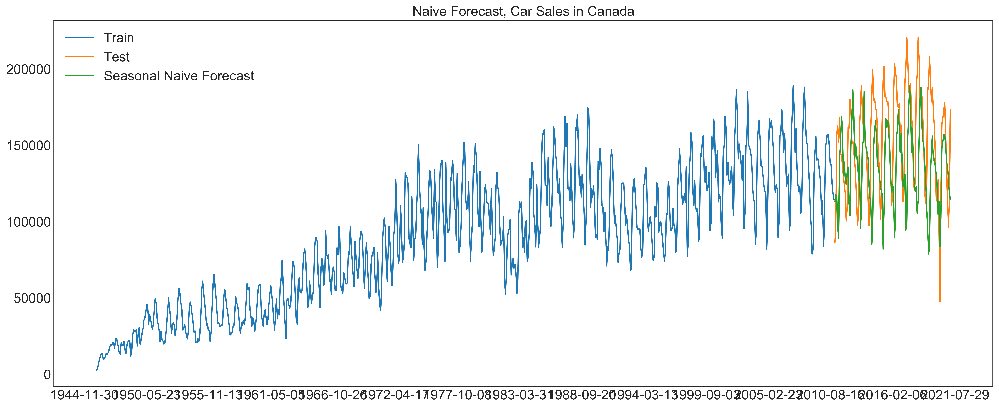

In [61]:
dd = np.asarray(train.VALUE)
y_hat = test.copy()
y_hat['naive'] = dd[len(dd)-1]
plt.figure(figsize=(20,8), dpi = 400)
plt.plot(train['REF_DATE'], train['VALUE'], label='Train')
plt.plot(test['REF_DATE'], test['VALUE'], label='Test')
plt.plot(test['REF_DATE'], test['snaive'], label='Seasonal Naive Forecast')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2000))
plt.title("Naive Forecast, Car Sales in Canada")
plt.show()

In [62]:
mae = mean_absolute_error(test['snaive'], test['VALUE'])
print('Seasonal Naive MAE: ', mae)

Seasonal Naive MAE:  30985.72357723577


### SARIMA(1, 1, 1)(1, 0, 0)[12]

In [63]:
mod = sm.tsa.statespace.SARIMAX(train['VALUE'],
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

/Users/rustem/Library/Python/3.8/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2987      0.150      1.998      0.046       0.006       0.592
ma.L1         -0.8001      0.099     -8.103      0.000      -0.994      -0.607
ar.S.L12       0.8371      0.053     15.682      0.000       0.732       0.942
sigma2      2.704e+08   8.66e-11   3.12e+18      0.000     2.7e+08     2.7e+08


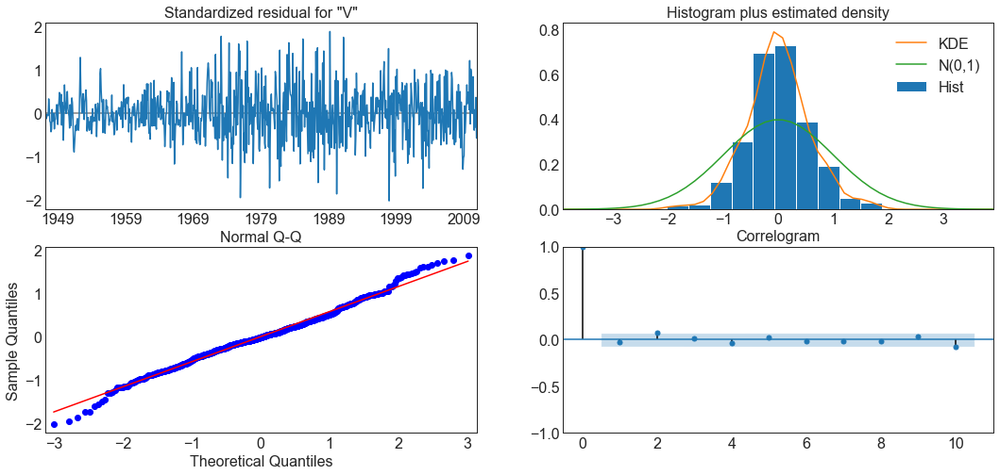

In [64]:
results.plot_diagnostics(figsize=(18, 8))
plt.show()


In [65]:
pred = results.get_prediction(start=pd.to_datetime('2011-01-01'), end = pd.to_datetime('2021-03-01'), dynamic=False)

In [66]:
pred.predicted_mean

2011-01-01     93274.260117
2011-02-01    109796.674594
2011-03-01    148889.964869
2011-04-01    152460.558769
2011-05-01    156590.796145
                  ...      
2020-11-01    148131.392649
2020-12-01    147431.028947
2021-01-01    143865.547547
2021-02-01    146657.278056
2021-03-01    153262.724679
Freq: MS, Name: predicted_mean, Length: 123, dtype: float64

In [67]:
test['sarima'] = pred.predicted_mean

<ipython-input-67-b2d131498172>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['sarima'] = pred.predicted_mean


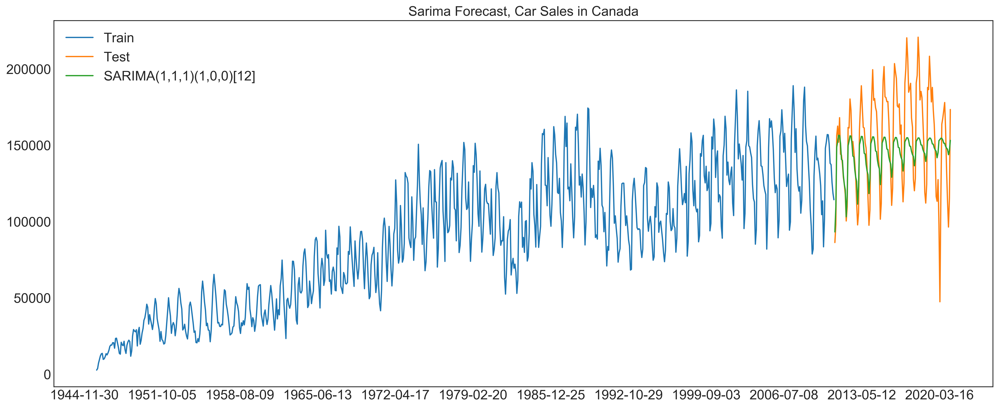

In [139]:
dd = np.asarray(train.VALUE)
y_hat = test.copy()
y_hat['naive'] = dd[len(dd)-1]
plt.figure(figsize=(20,8), dpi = 400)
plt.plot(train['REF_DATE'], train['VALUE'], label='Train')
plt.plot(test['REF_DATE'], test['VALUE'], label='Test')
plt.plot(test['REF_DATE'], test['sarima'], label='SARIMA(1,1,1)(1,0,0)[12]')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2500))
plt.title("Sarima Forecast, Car Sales in Canada")
plt.show()

In [69]:
mae = mean_absolute_error(test['sarima'], test['VALUE'])
print('Sarima MAE: ', mae)

Sarima MAE:  22783.42338423387


### Алгоритм Хиндмана-Хандакара автоматического подбора SARIMA.

Я буду использовать пакет AutoARIMA из sktime, так как его принцип базируется на Hyndman and Khandakar через stepwise = True => Используется алгоритм Хиндмана-Хандакара

In [129]:
from sktime.forecasting.arima import AutoARIMA

Обучим модель SARIMA, с stepwise = True, то есть используя алгоритм Hyndman and Khandakar

In [130]:
sarima_optimal_model = AutoARIMA(start_p=1, d=None, start_q=1, 
                       max_p=1, max_d=1, max_q=1, 
                       start_P=0, D=0, start_Q=0, 
                       max_P=1, max_D=0, max_Q=0, 
                       sp=12, stepwise=True)

In [131]:
sarima_optimal_model.fit(train['VALUE'])

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.

AutoARIMA(D=0, max_D=0, max_P=1, max_Q=0, max_d=1, max_p=1, max_q=1, sp=12,
          start_P=0, start_Q=0, start_p=1, start_q=1)

In [132]:
sarima_optimal_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  780
Model:             SARIMAX(0, 1, 1)x(1, 0, [], 12)   Log Likelihood               -8249.795
Date:                             Wed, 16 Jun 2021   AIC                          16505.591
Time:                                     00:30:58   BIC                          16519.565
Sample:                                          0   HQIC                         16510.966
                                             - 780                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5754      0.024    -24.317      0.000      -0.622      -0.529
ar.S.L12       0.8581      0.016     55.150      0.000       0.828       0.889
sigma2      9.075e+07   2.87e-11   3.16e+18      0.000    9.08e+07    9.08e+07
===================================================================================
Ljung-Box (L1) (Q):                   2.62   Jarque-Bera (JB):                18.17
Prob(Q):                              0.11   Prob(JB):                         0.00
Heteroskedasticity (H):               2.62   Skew:                             0.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.98e+33. Standard errors may be unstable.
"""

In [133]:
fh = ForecastingHorizon(test.index, is_relative=False)
fh

ForecastingHorizon(['2011-01', '2011-02', '2011-03', '2011-04', '2011-05', '2011-06',
             '2011-07', '2011-08', '2011-09', '2011-10',
             ...
             '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11',
             '2020-12', '2021-01', '2021-02', '2021-03'],
            dtype='period[M]', name='REF_DATE', length=123, freq='M', is_relative=False)

In [134]:
optimal_sarima_pred = pd.DataFrame(sarima_optimal_model.predict(fh), index = test.index)
optimal_sarima_pred.columns = ['predicted values sarima']
optimal_sarima_pred

,predicted values sarima
REF_DATE,
2011-01,93474.741879
2011-02,109157.494460
2011-03,148856.928986
2011-04,152405.198953
2011-05,156605.629785
...,...
2020-11,146103.965318
2020-12,145206.668868
2021-01,140682.030818


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


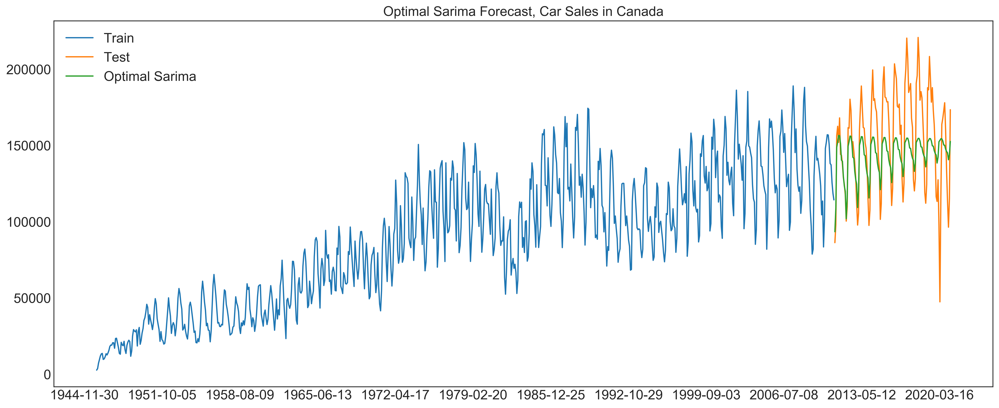

In [135]:
dd = np.asarray(train.VALUE)
y_hat = test.copy()
y_hat['naive'] = dd[len(dd)-1]
plt.figure(figsize=(20,8), dpi = 400)
plt.plot(train['REF_DATE'], train['VALUE'], label='Train')
plt.plot(test['REF_DATE'], test['VALUE'], label='Test')
plt.plot(test['REF_DATE'], optimal_sarima_pred['predicted values sarima'], label='Optimal Sarima')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2500))
plt.title("Optimal Sarima Forecast, Car Sales in Canada")
plt.show()

In [136]:
mae = mean_absolute_error(optimal_sarima_pred['predicted values sarima'], test['VALUE'])
print('Optimal Sarima MAE: ', mae)

Optimal Sarima MAE:  22661.92044699433


### ETS(AAA)

In [75]:
model = ETSModel(train['VALUE'], error="add", trend="add", seasonal="add",
                damped_trend=True, seasonal_periods=12)
fit = model.fit()
print(fit.summary())

                                 ETS Results                                  
Dep. Variable:                  VALUE   No. Observations:                  780
Model:                      ETS(AAdA)   Log Likelihood               -8175.495
Date:                Wed, 16 Jun 2021   AIC                          16388.990
Time:                        00:22:40   BIC                          16477.517
Sample:                    01-01-1946   HQIC                         16423.039
                         - 12-01-2010   Scale                     74397365.890
Covariance Type:               approx                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
smoothing_level         0.2775      0.027     10.221      0.000       0.224       0.331
smoothing_trend      2.775e-05      0.002      0.014      0.989      -0.004       0.004
smoothing_season

/Users/rustem/Library/Python/3.8/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()


In [76]:
pred = fit.get_prediction(start='2011', end='2021-03-01')

In [77]:
yhat_ets_aaa = pred.summary_frame(alpha=0.05)['mean']

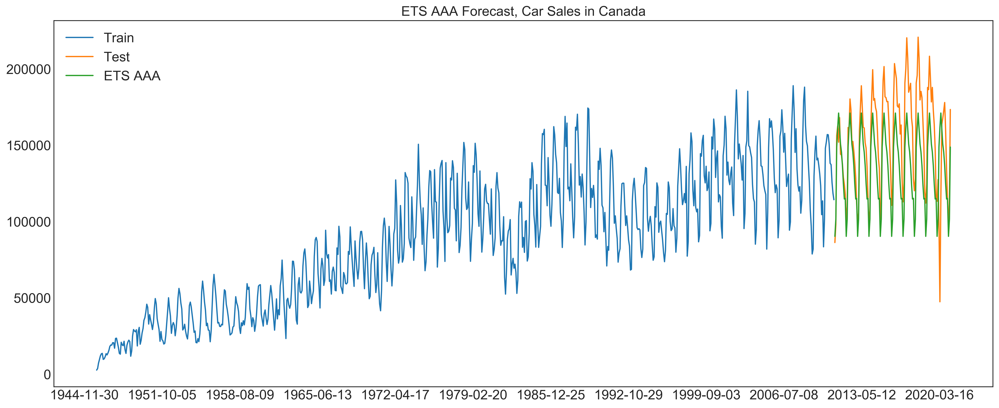

In [138]:
dd = np.asarray(train.VALUE)
y_hat = test.copy()
y_hat['naive'] = dd[len(dd)-1]
plt.figure(figsize=(20,8), dpi = 400)
plt.plot(train['REF_DATE'], train['VALUE'], label='Train')
plt.plot(test['REF_DATE'], test['VALUE'], label='Test')
plt.plot(test['REF_DATE'], yhat_ets_aaa, label='ETS AAA')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2500))
plt.title("ETS AAA Forecast, Car Sales in Canada")
plt.show()

In [79]:
mae = mean_absolute_error(yhat_ets_aaa, test['VALUE'])
print('Optimal ETS AAA MAE: ', mae)

Optimal ETS AAA MAE:  24074.69192051101


### ETS с автоматическим выбором по AIC

Буду использовать пакет Auto-ETS

In [80]:
test.index = pd.PeriodIndex(test.index, freq="M")
train.index = pd.PeriodIndex(train.index, freq="M")

In [81]:
auto_ets = AutoETS(auto = True, sp = 12)
auto_ets.fit(train['VALUE'])

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()


AutoETS(auto=True, sp=12)

In [82]:
auto_ets.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 ETS Results                                  
==============================================================================
Dep. Variable:                  VALUE   No. Observations:                  780
Model:                       ETS(ANA)   Log Likelihood               -8176.024
Date:                Wed, 16 Jun 2021   AIC                          16384.048
Time:                        00:22:47   BIC                          16458.596
Sample:                    01-31-1946   HQIC                         16412.720
                         - 12-31-2010   Scale                     74498274.996
Covariance Type:               approx                                         
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
smoothing_level         0.2804      0.027     10.410      0.000       0.228       0.333
smoothing_seasonal      0.3008      0.036      8.273      0.000       0.230       0.372
initial_level        9994.3333   5257.308      1.901      0.057    -309.801    2.03e+04
initial_seasonal.0  -2529.5417   5427.546     -0.466      0.641   -1.32e+04    8108.252
initial_seasonal.1  -1139.5833   5435.181     -0.210      0.834   -1.18e+04    9513.176
initial_seasonal.2   4640.6146   5480.969      0.847      0.397   -6101.887    1.54e+04
initial_seasonal.3   5403.7917   5510.560      0.981      0.327   -5396.707    1.62e+04
initial_seasonal.4   5456.0833   5618.162      0.971      0.331   -5555.313    1.65e+04
initial_seasonal.5   7370.1875   5460.332      1.350      0.177   -3331.866    1.81e+04
initial_seasonal.6   4321.4063   5431.090      0.796      0.426   -6323.334     1.5e+04
initial_seasonal.7  -1368.9167   5623.156     -0.243      0.808   -1.24e+04    9652.266
initial_seasonal.8   3516.5729   5582.045      0.630      0.529   -7424.033    1.45e+04
initial_seasonal.9   4450.2917   5526.004      0.805      0.421   -6380.476    1.53e+04
initial_seasonal.10  1189.1667   5445.573      0.218      0.827   -9483.960    1.19e+04
initial_seasonal.11          0   5426.153          0      1.000   -1.06e+04    1.06e+04
===================================================================================
Ljung-Box (Q):                      111.36   Jarque-Bera (JB):                21.68
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.24   Skew:                            -0.04
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
[2] Covariance matrix is singular or near-singular, with condition number 9.71e+15. Standard errors may be unstable.
"""

In [83]:
fh = ForecastingHorizon(test.index, is_relative=False)
fh

ForecastingHorizon(['2011-01', '2011-02', '2011-03', '2011-04', '2011-05', '2011-06',
             '2011-07', '2011-08', '2011-09', '2011-10',
             ...
             '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11',
             '2020-12', '2021-01', '2021-02', '2021-03'],
            dtype='period[M]', name='REF_DATE', length=123, freq='M', is_relative=False)

In [84]:
auto_ets_preds = auto_ets.predict(fh)
auto_ets_preds

REF_DATE
2011-01     90439.674871
2011-02    101710.661520
2011-03    148932.509888
2011-04    161640.816407
2011-05    171219.868412
               ...      
2020-11    114832.685612
2020-12    115283.751493
2021-01     90439.674871
2021-02    101710.661520
2021-03    148932.509888
Freq: M, Length: 123, dtype: float64

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


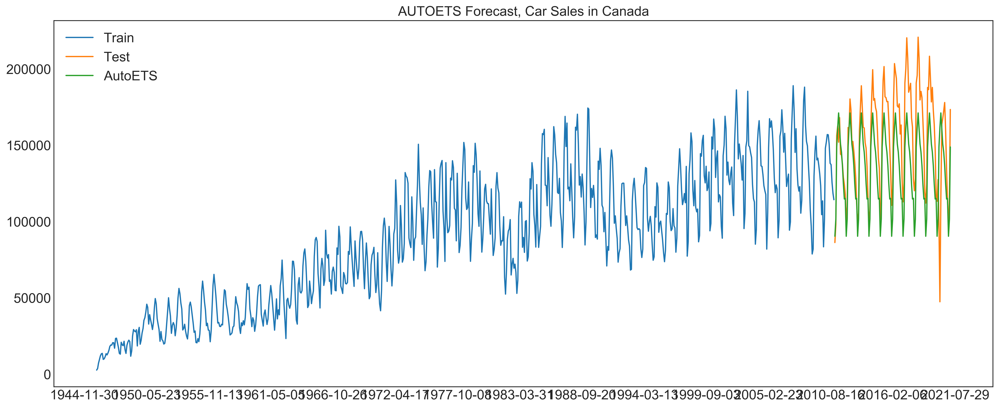

In [85]:
dd = np.asarray(train.VALUE)
y_hat = test.copy()
y_hat['naive'] = dd[len(dd)-1]
plt.figure(figsize=(20,8), dpi = 400)
plt.plot('REF_DATE', 'VALUE', label='Train', data = train)
plt.plot('REF_DATE', 'VALUE', label='Test', data = test)
plt.plot(test['REF_DATE'], auto_ets_preds, label='AutoETS')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2500))
plt.title("AUTOETS Forecast, Car Sales in Canada")
plt.show()

In [86]:
mae = mean_absolute_error(auto_ets_preds, test['VALUE'])
print('Auto ETS MAE: ', mae)

Auto ETS MAE:  24052.716296943487


AUTO ETS чуть лучше, чем обычная ETS

## Задание 5

Выбери наилучшую модель и построй график прогнозов для неё на один год вперёд использовав все 100% наблюдений как обучающую выборку.

In [87]:
mod = sm.tsa.statespace.SARIMAX(time_series['VALUE'],
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

/Users/rustem/Library/Python/3.8/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/optimize/lbfgsb.py:339: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  task_str = task.tostring()


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5870      0.049     11.865      0.000       0.490       0.684
ma.L1         -0.9742      0.022    -44.042      0.000      -1.018      -0.931
ar.S.L12       0.8026      0.044     18.129      0.000       0.716       0.889
sigma2      3.102e+08   6.37e-11   4.87e+18      0.000     3.1e+08     3.1e+08


In [88]:
pred = results.get_prediction(start=pd.to_datetime('2021-04-01'), end = pd.to_datetime('2022-04-01'), dynamic=False)

In [89]:
pred.predicted_mean

2021-04-01    105384.563361
2021-05-01    144261.637677
2021-06-01    173099.974958
2021-07-01    170524.349469
2021-08-01    171303.105401
2021-09-01    173724.569244
2021-10-01    158123.600594
2021-11-01    136360.279135
2021-12-01    119881.803808
2022-01-01    105839.982590
2022-02-01    120832.990826
2022-03-01    167436.848515
2022-04-01    112732.371588
Freq: MS, Name: predicted_mean, dtype: float64

In [90]:
optimal_sarima_pred['best'] = pred.predicted_mean

In [91]:
time_series.REF_DATE = pd.to_datetime(time_series['REF_DATE'])

/Users/rustem/Library/Python/3.8/lib/python/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [92]:
pred.predicted_mean.index

DatetimeIndex(['2021-04-01', '2021-05-01', '2021-06-01', '2021-07-01',
               '2021-08-01', '2021-09-01', '2021-10-01', '2021-11-01',
               '2021-12-01', '2022-01-01', '2022-02-01', '2022-03-01',
               '2022-04-01'],
              dtype='datetime64[ns]', freq='MS')

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


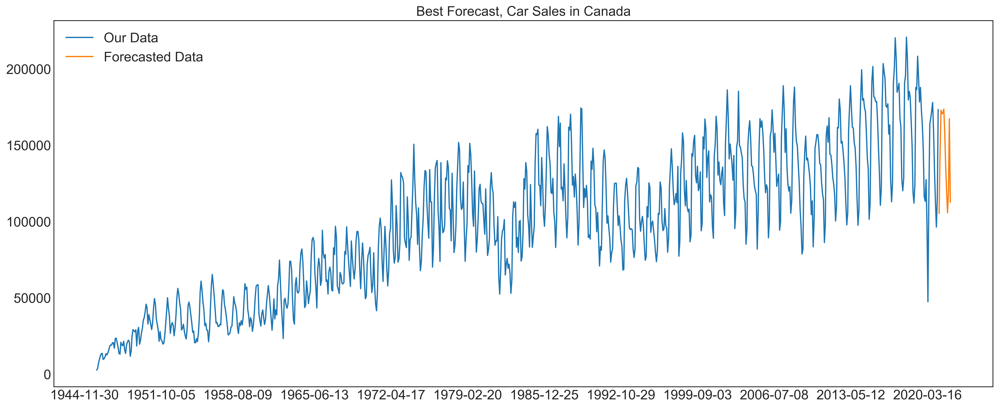

In [137]:
dd = np.asarray(time_series.VALUE)
plt.figure(figsize=(20,8), dpi = 400)
plt.plot(time_series['REF_DATE'], time_series['VALUE'], label='Our Data')
plt.plot(pred.predicted_mean.index, pred.predicted_mean, label='Forecasted Data')
plt.legend(loc='best')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(2500))
plt.title("Best Forecast, Car Sales in Canada")
plt.show()

Судя по графику - все достаточно логично, предсказание вышло неплохое

## Задание 6

In [27]:
import matplotlib.pyplot as plt
from linearmodels.datasets import wage_panel
from linearmodels.panel import PooledOLS
import statsmodels.api as sm
import pandas as pd
import numpy as np

In [25]:
!pip install linearmodels

You should consider upgrading via the '/Users/ggoloviznin/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


Для выполнения заданий был выбран набор данных по индивидам.

In [ ]:
#!brew install wget

In [17]:
!wget https://www.dropbox.com/s/yw6k857v1up31vg/indiv_csv.csv?dl=0

--2021-06-15 23:27:38--  https://www.dropbox.com/s/yw6k857v1up31vg/indiv_csv.csv?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.71.18
Connecting to www.dropbox.com (www.dropbox.com)|162.125.71.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/yw6k857v1up31vg/indiv_csv.csv [following]
--2021-06-15 23:27:38--  https://www.dropbox.com/s/raw/yw6k857v1up31vg/indiv_csv.csv
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc88975fda14d61b79196117a746.dl.dropboxusercontent.com/cd/0/inline/BQeJwo4HpTFNnXwbyVDBtUik-vq5bu-ocrGgE85ExkfNXB49QMON442AawHTt1UjGJxL6gqv2ViLRBrE-uXMLUC-ni9xaAEgl1YN3VyRNPPhxh0Qm99L8faO6E_m2qM1XTrZdC5AdOYMHxFm8qvjVphg/file# [following]
--2021-06-15 23:27:39--  https://uc88975fda14d61b79196117a746.dl.dropboxusercontent.com/cd/0/inline/BQeJwo4HpTFNnXwbyVDBtUik-vq5bu-ocrGgE85ExkfNXB49QMON442AawHTt1UjGJxL6gqv2ViLRBrE-uXMLUC-ni9xaAEgl1YN3VyRNPPh

In [18]:
df=pd.read_csv('indiv_csv.csv')

## Задание 7

Изучаемый вопрос был поставлен следующим образом: помогает ли общий доход за последние 30 дней предсказывать среднедневной объём (в граммах) потребления сухого вина и шампанского за последние 30 дней?

Проверяется предположение о том, что , возможно, так как сухое вино и шампанское являются более дорогими алкогольными напитками, то с ростом дохода индивиды могут больше их употреблять.

In [19]:
#Возьмем данные, где нет пропусков по потреблению сухого вина и шампанского
data = df[~df['M84_2B'].isna()]

#Уберем нечисловые варианты ответы
data = data[(data['J60'] != 'ОТКАЗ ОТ ОТВЕТА') & 
                  (data['J60'] != 'НЕТ ОТВЕТА') & 
                  (data['J60'] != 'ЗАТРУДНЯЮСЬ ОТВЕТИТЬ')]

data = data[(data['M84_2B'] != 'ОТКАЗ ОТ ОТВЕТА') & 
                  (data['M84_2B'] != 'НЕТ ОТВЕТА') & 
                  (data['M84_2B'] != 'ЗАТРУДНЯЮСЬ ОТВЕТИТЬ')]

In [20]:
#Отсортируем по индексу индивидов и по годам
data.sort_values(by=['idind', 'year'], inplace=True)
data.reset_index(inplace=True)
data.drop('index', axis = 1, inplace=True)

In [21]:
#Для регрессии отберем id индивида, год, весь доход за последний месяц и среднее потребление сухого вина и
#шампанского в день за последний месяц
data_reg = data[['idind', 'year', 'J60', 'M84_2B']]
data_reg.rename(columns = {'J60':'total_income', 'M84_2B': 'gr_consumed'}, inplace=True)

In [22]:
data_reg = data_reg.astype({"total_income": float})
data_reg = data_reg.astype({"gr_consumed": float})

In [23]:
#Отбросим нулевые значения 
data_reg = data_reg[~(data_reg['gr_consumed'] == 0)]
data_reg = data_reg[~(data_reg['total_income'] == 0)]

In [24]:
data_reg_ln = data_reg.copy()

In [25]:
#Применяем логарифмирование. Далее регрессии будут строиться с логарифмами
for i in data_reg.index:
    data_reg_ln.loc[i, 'total_income'] = np.log(data_reg.loc[i, 'total_income'])
    data_reg_ln.loc[i, 'gr_consumed'] = np.log(data_reg.loc[i, 'gr_consumed'])

## Задание 8

Построим график для получения илюстрационного представления наличия зависимости.

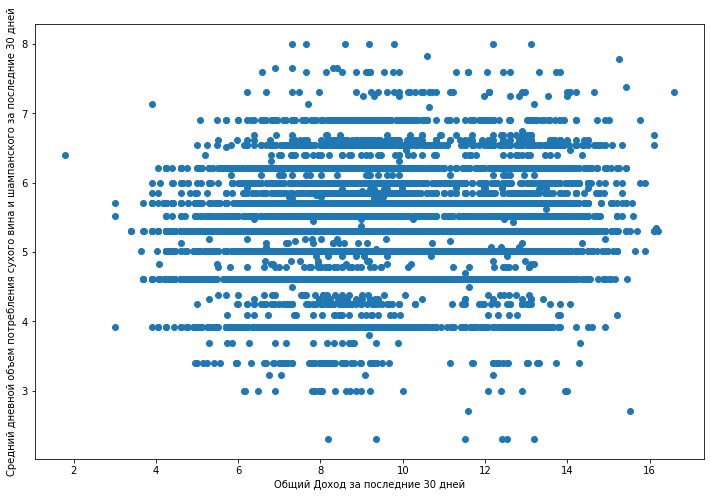

In [28]:
fit=plt.figure(figsize=(12,8))
plt.scatter(data_reg_ln.total_income, data_reg_ln.gr_consumed)
plt.xlabel('Общий Доход за последние 30 дней')
plt.ylabel('Средний дневной объем потребления сухого вина и шампанского за последние 30 дней')
plt.show()

Можно увидеть, что четкой зависимости нет, однако наблюдается смещение паттерна вправо-вверх, что может говорить о том, что некоторое влияние имеется. Проверим это статистическими методами.

## Задание 9

Подготовим данные для построения регрессий.

In [29]:
#необходимо создать мультииндекс
data_reg_ln.set_index(['idind', 'year'], inplace=True)

In [30]:
exog_vars = ['total_income']
exog = sm.add_constant(data_reg_ln[exog_vars])
mod_pooled = PooledOLS(data_reg_ln.gr_consumed, exog)

pooled_res = mod_pooled.fit()

In [31]:
print(pooled_res)

                          PooledOLS Estimation Summary                          
Dep. Variable:            gr_consumed   R-squared:                        0.0085
Estimator:                  PooledOLS   R-squared (Between):              0.0127
No. Observations:               15511   R-squared (Within):               0.0015
Date:                Tue, Jun 15 2021   R-squared (Overall):              0.0085
Time:                        23:40:39   Log-likelihood                -1.525e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      132.81
Entities:                        8059   P-value                           0.0000
Avg Obs:                       1.9247   Distribution:                 F(1,15509)
Min Obs:                       1.0000                                           
Max Obs:                       13.000   F-statistic (robust):             132.81
                            

Видим, что коэффициент при доходе является значимым.

Теперь построим модель со случайными эффектами.

In [32]:
from linearmodels.panel import RandomEffects
mod_re = RandomEffects(data_reg_ln.gr_consumed, exog)
re_res = mod_re.fit()
print(re_res)

                        RandomEffects Estimation Summary                        
Dep. Variable:            gr_consumed   R-squared:                        0.6425
Estimator:              RandomEffects   R-squared (Between):              0.0122
No. Observations:               15511   R-squared (Within):               0.0023
Date:                Tue, Jun 15 2021   R-squared (Overall):              0.0084
Time:                        23:40:42   Log-likelihood                -1.173e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                   2.787e+04
Entities:                        8059   P-value                           0.0000
Avg Obs:                       1.9247   Distribution:                 F(1,15509)
Min Obs:                       1.0000                                           
Max Obs:                       13.000   F-statistic (robust):             110.84
                            

Коэффиент отличается несильно. При этом также является значимым.

Построим модель с фиксированными эффектами.

In [33]:
from linearmodels.panel import PanelOLS
mod_fe = PanelOLS(data_reg_ln.gr_consumed, exog, entity_effects=True)
fe_res = mod_fe.fit()
print(fe_res)

                          PanelOLS Estimation Summary                           
Dep. Variable:            gr_consumed   R-squared:                        0.0032
Estimator:                   PanelOLS   R-squared (Between):              0.0094
No. Observations:               15511   R-squared (Within):               0.0032
Date:                Tue, Jun 15 2021   R-squared (Overall):              0.0070
Time:                        23:40:44   Log-likelihood                   -6139.8
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      24.247
Entities:                        8059   P-value                           0.0000
Avg Obs:                       1.9247   Distribution:                  F(1,7451)
Min Obs:                       1.0000                                           
Max Obs:                       13.000   F-statistic (robust):             24.247
                            

Коэффицент изменился: стал меньше. По-прежнему является значимым.

Здесь же мы сразу можем наблюдать тестирование того, что индивидуальные эффекты равны нулю. Видно, что гипотеза отвергается, что означает то, что модель с фиксированными индивидуальными эффектами лучше, чем модель сквозной регрессии.

Сравним FE и RE модели. Для этого используетя тест Хаусмана. Нулевая гипотеза в нашем случае заключается в том, что ковариация между индивидуальными эффектами и регрессором - общий доход за последние 30 дней - равно нулю. Если гипотеза не отвергается, то предпочтительнее использовать модель со случайными эффектами.

In [34]:
#Source: https://towardsdatascience.com/a-guide-to-panel-data-regression-theoretics-and-implementation-with-python-4c84c5055cf8

import numpy.linalg as la
from scipy import stats
import numpy as np
def hausman(fe, re):
    b = fe.params
    B = re.params
    v_b = fe.cov
    v_B = re.cov
    
    df = b[np.abs(b) < 1e8].size
    chi2 = np.dot((b - B).T, la.inv(v_b - v_B).dot(b - B)) 
 
    pval = stats.chi2.sf(chi2, df)
    
    return chi2, df, pval

hausman_results = hausman(fe_res, re_res)

print('chi-Squared: ' + str(hausman_results[0]))
print('degrees of freedom: ' + str(hausman_results[1]))
print('p-Value: ' + str(hausman_results[2]))

chi-Squared: 14.59436204896748
degrees of freedom: 2
p-Value: 0.0006774457891113116


Видно, что нулевая гипотеза отвергается. Следовательно, ковариация между индивидуальными эффектами и регрессором не равно нулю, поэтому выбираем модель с фиксированными эффектами.

## Задание 10

Таким образом, по результатам регрессий получили оценку коэффициента при общем доходе, которая является положительной и значимой. Предполагая в данном задании только один регрессор, можем считать, что общий доход помогает предсказывать среднедневной объём потребления вина и сухого шампанского, однако, стоит понимать, что в данном случае для получения более точного результата необходимо использовать контролирующие переменные.

Интерпретация коэффициента: в среднем при прочих равных увеличиение общего дохода за месяц на 1% связано с увеличиением среднедневного потребления сухого вина и шампанского за месяц на 0,016% (из модели с фиксированными эффектами). Как можно увидеть, значение коэффициента мало. Вероятно, требуется ощутимое изменение дохода, чтобы было заметное увеличение потребления.